In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import datetime
import time

%matplotlib inline
sns.set(rc = {"figure.figsize" : (8, 6)})

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
data=pd.read_csv('/content/drive/MyDrive/Grad1/T1.csv',parse_dates=['Date/Time'])
data.head()

,Date/Time,LV ActivePower (kW),Wind Speed (m/s),Theoretical_Power_Curve (KWh),Wind Direction (°)
0,2018-01-01 00:00:00,380.047791,5.311336,416.328908,259.994904
1,2018-01-01 00:10:00,453.769196,5.672167,519.917511,268.641113
2,2018-01-01 00:20:00,306.376587,5.216037,390.900016,272.564789
3,2018-01-01 00:30:00,419.645905,5.659674,516.127569,271.258087
4,2018-01-01 00:40:00,380.650696,5.577941,491.702972,265.674286


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50530 entries, 0 to 50529
Data columns (total 5 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   Date/Time                      50530 non-null  datetime64[ns]
 1   LV ActivePower (kW)            50530 non-null  float64       
 2   Wind Speed (m/s)               50530 non-null  float64       
 3   Theoretical_Power_Curve (KWh)  50530 non-null  float64       
 4   Wind Direction (°)             50530 non-null  float64       
dtypes: datetime64[ns](1), float64(4)
memory usage: 1.9 MB


In [ ]:
data.describe()

,LV ActivePower (kW),Wind Speed (m/s),Theoretical_Power_Curve (KWh),Wind Direction (°)
count,50530.000000,50530.000000,50530.000000,50530.000000
mean,1307.684332,7.557952,1492.175463,123.687559
std,1312.459242,4.227166,1368.018238,93.443736
min,-2.471405,0.000000,0.000000,0.000000
25%,50.677890,4.201395,161.328167,49.315437
50%,825.838074,7.104594,1063.776283,73.712978
75%,2482.507568,10.300020,2964.972462,201.696720
max,3618.732910,25.206011,3600.000000,359.997589


In [ ]:
data.isnull().sum()

Date/Time                        0
LV ActivePower (kW)              0
Wind Speed (m/s)                 0
Theoretical_Power_Curve (KWh)    0
Wind Direction (°)               0
dtype: int64

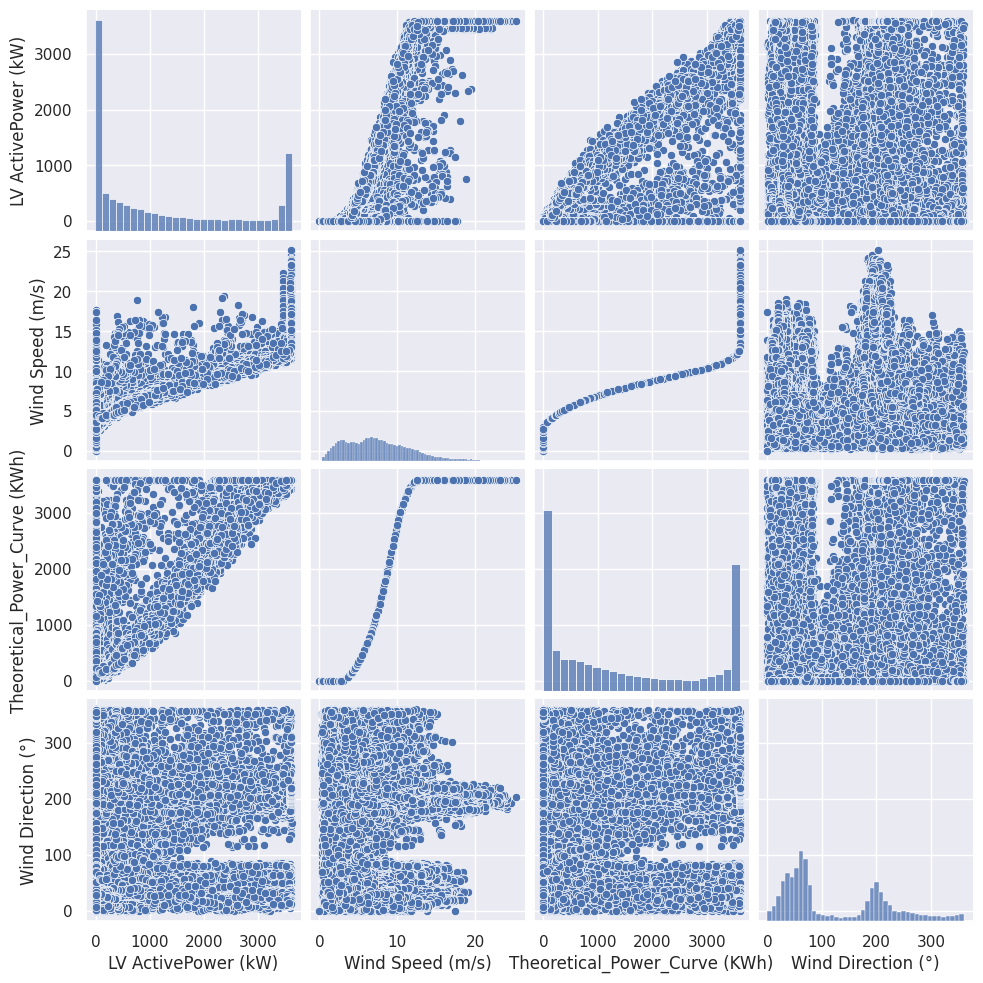

In [ ]:
# Pair Plot correlation between all attributes
sns.pairplot(data)

<ipython-input-8-6ef77e6e00f8>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = data.corr()


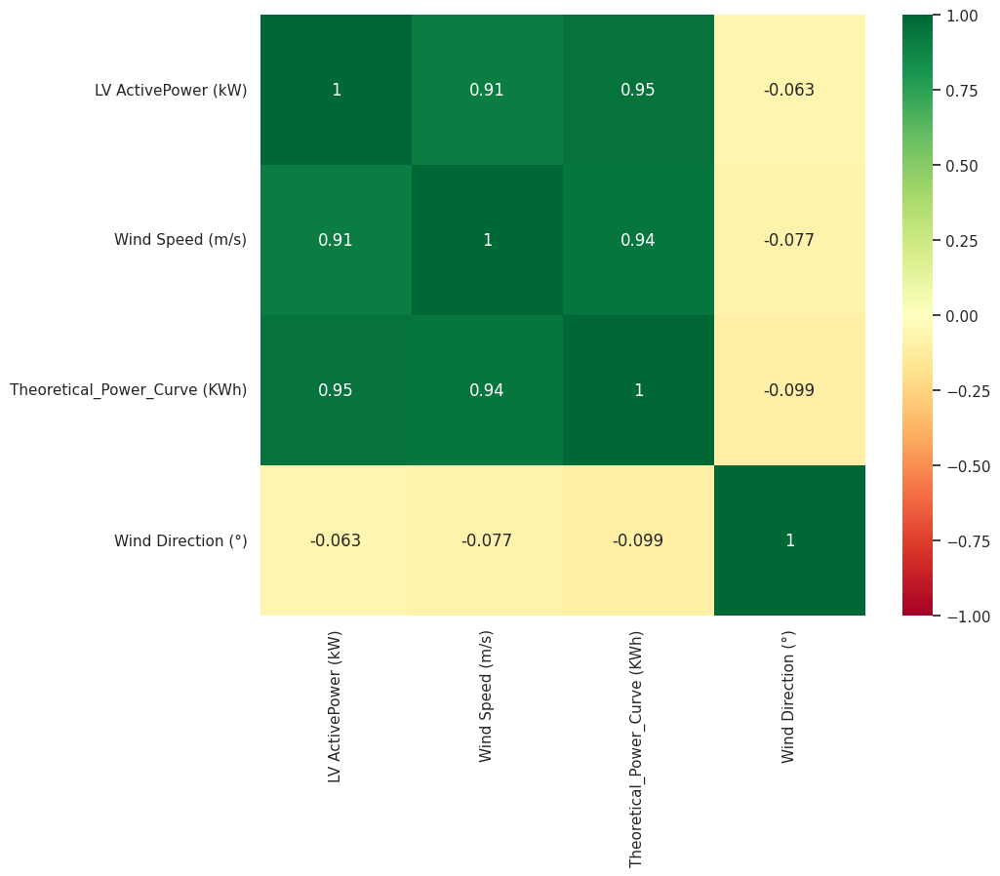

In [ ]:
corr = data.corr()
plt.figure(figsize=(10, 8))

ax = sns.heatmap(corr, vmin = -1, vmax = 1, annot = True,cmap="RdYlGn")
bottom, top = ax.get_ylim()
#ax.set_ylim(bottom + 0.5, top - 0.5)
plt.show()
#corr

In [ ]:
# Importing a visualization library
! pip install windrose

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


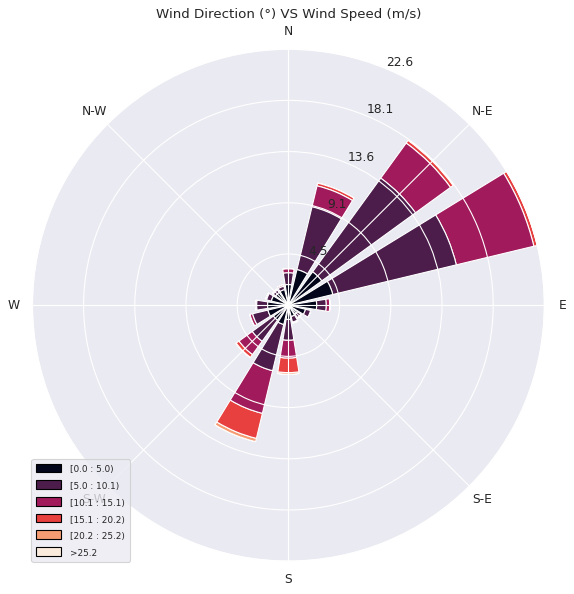

In [ ]:
from windrose import WindroseAxes

ax = WindroseAxes.from_ax()
ax.bar(data['Wind Direction (°)'], data['Wind Speed (m/s)'], normed=True, opening=0.8, edgecolor='white')
ax.set_legend()
plt.title("Wind Direction (°) VS Wind Speed (m/s)")
plt.show()

<ipython-input-11-de9d3fc7c34b>:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data.iloc[:,i+1], shade=True)
<ipython-input-11-de9d3fc7c34b>:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data.iloc[:,i+1], shade=True)
<ipython-input-11-de9d3fc7c34b>:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data.iloc[:,i+1], shade=True)
<ipython-input-11-de9d3fc7c34b>:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data.iloc[:,i+1], shade=True)


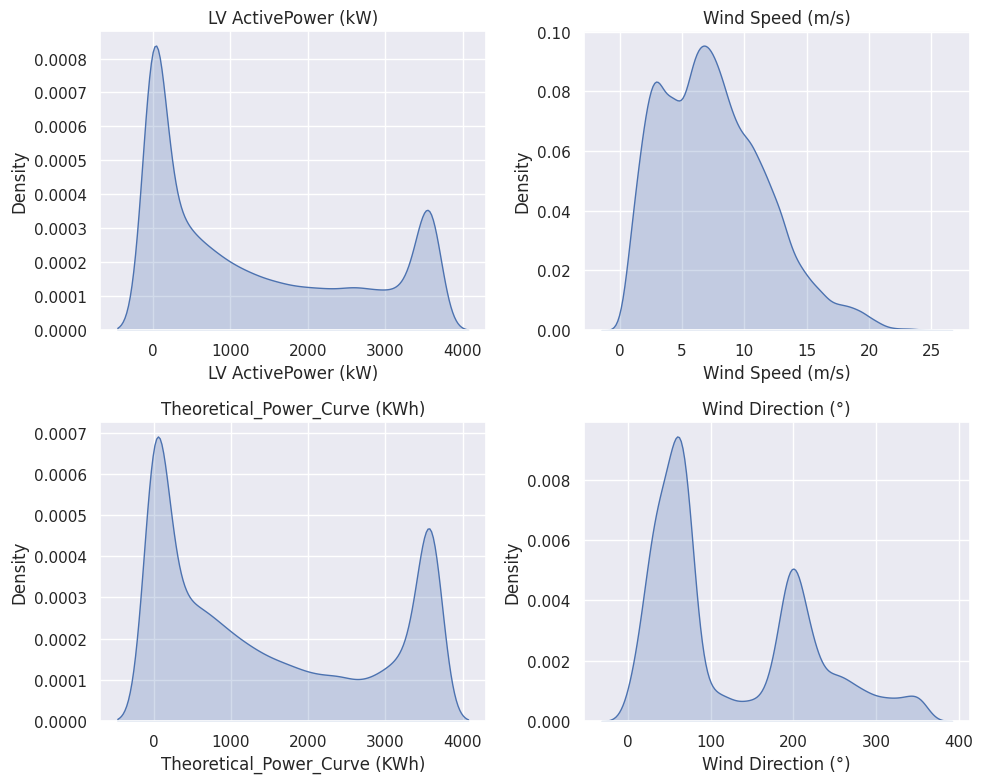

In [ ]:
#plotting the data distribution
plt.figure(figsize=(10, 8))
for i in range(4):
    plt.subplot(2, 2, i+1)
    sns.kdeplot(data.iloc[:,i+1], shade=True)
    plt.title(data.columns[i+1])
plt.tight_layout()
plt.show()

In [ ]:
# droping all the null values from the data
data = data.dropna()

In [ ]:
data["Date/Time"] = pd.to_datetime(data["Date/Time"], format = "%d %m %Y %H:%M", errors = "coerce")
data

,Date/Time,LV ActivePower (kW),Wind Speed (m/s),Theoretical_Power_Curve (KWh),Wind Direction (°)
0,2018-01-01 00:00:00,380.047791,5.311336,416.328908,259.994904
1,2018-01-01 00:10:00,453.769196,5.672167,519.917511,268.641113
2,2018-01-01 00:20:00,306.376587,5.216037,390.900016,272.564789
3,2018-01-01 00:30:00,419.645905,5.659674,516.127569,271.258087
4,2018-01-01 00:40:00,380.650696,5.577941,491.702972,265.674286
...,...,...,...,...,...
50525,2018-12-31 23:10:00,2963.980957,11.404030,3397.190793,80.502724
50526,2018-12-31 23:20:00,1684.353027,7.332648,1173.055771,84.062599
50527,2018-12-31 23:30:00,2201.106934,8.435358,1788.284755,84.742500
50528,2018-12-31 23:40:00,2515.694092,9.421366,2418.382503,84.297913


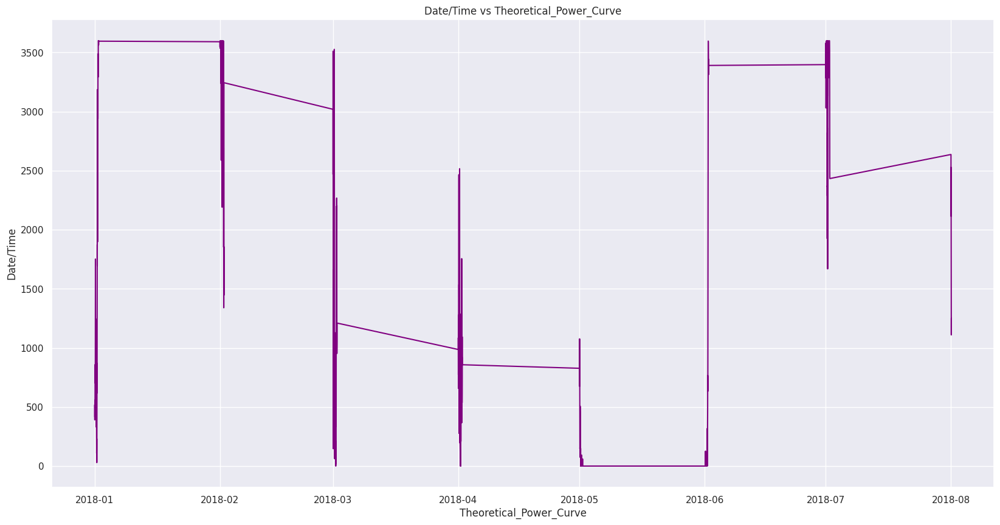

In [ ]:
# Create figure and plot space
fig, ax = plt.subplots(figsize=(20,10))

# Add x-axis and y-axis
ax.plot(data['Date/Time'][0:1000],
        data['Theoretical_Power_Curve (KWh)'][0:1000],
        color='purple')

# Set title and labels for axes
ax.set(xlabel="Theoretical_Power_Curve",
       ylabel="Date/Time",
       title="Date/Time vs Theoretical_Power_Curve")

plt.show()

In [ ]:
# Droping all the irrelavent features that dosent affect the target variable.
cols = ["Wind Direction (°)",]
data = data.drop(cols, axis=1)
data.head()

,Date/Time,LV ActivePower (kW),Wind Speed (m/s),Theoretical_Power_Curve (KWh)
0,2018-01-01 00:00:00,380.047791,5.311336,416.328908
1,2018-01-01 00:10:00,453.769196,5.672167,519.917511
2,2018-01-01 00:20:00,306.376587,5.216037,390.900016
3,2018-01-01 00:30:00,419.645905,5.659674,516.127569
4,2018-01-01 00:40:00,380.650696,5.577941,491.702972


In [ ]:

df = data.copy()

In [ ]:
pip install tensorboard==<version>


/bin/bash: -c: line 0: syntax error near unexpected token `newline'
/bin/bash: -c: line 0: `pip install tensorboard==<version>'


In [ ]:
%load_ext tensorboard
from tensorflow.keras.callbacks import TensorBoard

In [ ]:
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from pandas import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import GRU
from math import sqrt
from matplotlib import pyplot
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler

<ipython-input-19-007232589c9f>:5: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  from pandas import datetime


In [ ]:
df = df.set_index('Date/Time')

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, SimpleRNN
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import MeanSquaredError
import tensorflow as tf
import datetime

In [ ]:
batch_size_exp = 1
epoch_exp = 15
neurons_exp = 10
predict_values_exp = 1000
lag_exp=24

In [ ]:
def timeseries_to_supervised(data, lag=1):
    df = DataFrame(data)
    columns = [df.shift(i) for i in range(1, lag+1)]
    columns.append(df)
    df = concat(columns, axis=1)
    df.fillna(0, inplace=True)
    return df

In [ ]:
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)

In [ ]:
def inverse_difference(history, yhat, interval=1):
    return yhat + history[-interval]

In [ ]:
def scale(train, test):
    # fit scaler
    scaler = MinMaxScaler(feature_range=(-1, 1))
    scaler = scaler.fit(train)
    # transform train
    train = train.reshape(train.shape[0], train.shape[1])
    train_scaled = scaler.transform(train)
    # transform test
    test = test.reshape(test.shape[0], test.shape[1])
    test_scaled = scaler.transform(test)
    return scaler, train_scaled, test_scaled

In [ ]:
def invert_scale(scaler, X, value):
    new_row = [x for x in X] + [value]
    array = np.array(new_row)
    array = array.reshape(1, len(array))
    inverted = scaler.inverse_transform(array)
    return inverted[0, -1]

In [ ]:

def fit_lstm(train, batch_size, nb_epoch, neurons):
    X, y = train[:, 0:-1], train[:, -1]
    X = X.reshape(X.shape[0], 1, X.shape[1])
    print(X)
    model = Sequential()
    model.add(LSTM(neurons, batch_input_shape=(batch_size, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dense(1))
    model.compile(loss='mean_squared_error', optimizer='adam')
    log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
    tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
    for i in range(nb_epoch):
        history=model.fit(X,y,validation_data=(X,y),epochs=1, batch_size=batch_size, verbose=1,shuffle= False,callbacks=[tensorboard_callback])
        model.reset_states()
    return model
    print(model.summary)

In [ ]:
def fit_gru(train, batch_size, nb_epoch, neurons):
    X, y = train[:, 0:-1], train[:, -1]
    X = X.reshape(X.shape[0], 1, X.shape[1])
    print(X)
    model = Sequential()
    model.add(GRU(neurons, batch_input_shape=(batch_size, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dense(1))
    model.compile(loss='mean_squared_error', optimizer='adam')
    log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
    tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
    for i in range(nb_epoch):
        history=model.fit(X,y,validation_data=(X,y),epochs=1, batch_size=batch_size, verbose=1,shuffle= False,callbacks=[tensorboard_callback])
        model.reset_states()
    return model
    print(model.summary)

In [ ]:
def fit_rnn(train, batch_size, nb_epoch, neurons):
    X, y = train[:, 0:-1], train[:, -1]
    X = X.reshape(X.shape[0], 1, X.shape[1])
    print(X)
    model = Sequential()
    model.add(SimpleRNN(neurons, batch_input_shape=(batch_size, X.shape[1], X.shape[2]), stateful=True))
    from keras.layers import Flatten
    model.add(Flatten())
    model.add(Dense(1))
    model.compile(loss='mean_squared_error', optimizer='adam')
    log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
    tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
    for i in range(nb_epoch):
        history=model.fit(X,y,validation_data=(X,y),epochs=1, batch_size=batch_size, verbose=1,shuffle= False,callbacks=[tensorboard_callback])
        model.reset_states()
    return model
    print(model.summary)

In [ ]:
def forecast_lstm(model, batch_size, X):
    X = X.reshape(1, 1, len(X))
    #print(X)
    yhat = model.predict(X, batch_size=1)
    return yhat[0,0]

In [ ]:
'''Drop all the features as we will not be having any in production'''
del df['LV ActivePower (kW)']
del df['Wind Speed (m/s)']
df.head()

,Theoretical_Power_Curve (KWh)
Date/Time,
2018-01-01 00:00:00,416.328908
2018-01-01 00:10:00,519.917511
2018-01-01 00:20:00,390.900016
2018-01-01 00:30:00,516.127569
2018-01-01 00:40:00,491.702972


In [ ]:
for i in range(0,10):
  df = df[:-1]
df.tail()

,Theoretical_Power_Curve (KWh)
Date/Time,
2018-12-31 21:30:00,1811.263260
2018-12-31 21:40:00,1787.100338
2018-12-31 21:50:00,2777.504103
2018-12-31 22:00:00,3025.199012
2018-12-31 22:10:00,3161.693967


In [ ]:

# transform data to be stationary
raw_values = df.values
diff_values = difference(raw_values, 1)

In [ ]:

# transform data to be supervised learning
supervised = timeseries_to_supervised(diff_values, lag_exp)
supervised_values = supervised.values
print(diff_values)
print("g")
print(supervised_values)

0         [103.58860323663299]
1          [-129.017495250543]
2         [125.22755316472296]
3        [-24.424597022085948]
4          [7.733413071217001]
                 ...          
50514     [-732.6479594382299]
50515    [-24.162922344330127]
50516        [990.40376546276]
50517      [247.6949090425801]
50518     [136.49495487885997]
Length: 50519, dtype: object
g
[[0 0 0 ... 0 0 array([103.58860324])]
 [array([103.58860324]) 0 0 ... 0 0 array([-129.01749525])]
 [array([-129.01749525]) array([103.58860324]) 0 ... 0 0
  array([125.22755316])]
 ...
 [array([-24.16292234]) array([-732.64795944]) array([716.76205412]) ...
  array([-0.56600741]) array([-20.46557444]) array([990.40376546])]
 [array([990.40376546]) array([-24.16292234]) array([-732.64795944]) ...
  array([11.45040406]) array([-0.56600741]) array([247.69490904])]
 [array([247.69490904]) array([990.40376546]) array([-24.16292234]) ...
  array([53.93162806]) array([11.45040406]) array([136.49495488])]]


In [ ]:
# split data into train and test-sets
train, test = supervised_values[0:-predict_values_exp], supervised_values[-predict_values_exp:]

In [ ]:
# transform the scale of the data
scaler, train_scaled, test_scaled = scale(train, test)

In [ ]:

def fit_lstm_rnn(train, batch_size, nb_epoch, neurons):
    X, y = train[:, 0:-1], train[:, -1]
    X = X.reshape(X.shape[0], 1, X.shape[1])
    print(X)
    model = Sequential()
    model.add(LSTM(neurons, batch_input_shape=(batch_size, X.shape[1], X.shape[2]), stateful=True))
    model.add(SimpleRNN(neurons, batch_input_shape=(batch_size, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dense(1))
    model.compile(loss='mean_squared_error', optimizer='adam')
    log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
    tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
    for i in range(nb_epoch):
        history=model.fit(X,y,validation_data=(X,y),epochs=1, batch_size=batch_size, verbose=1,shuffle= False,callbacks=[tensorboard_callback])
        model.reset_states()
    return model
    print(model.summary)

In [ ]:
# walk-forward validation on the test data
predictions = list()
expectations = list()
predictions_plot = list()
expectations_plot = list()
test_pred = list()
for i in range(len(test_scaled)):
    # make one-step forecast
    X, y = test_scaled[i, 0:-1], test_scaled[i, -1]
    yhat = forecast_lstm(rnn_model, 1, X)#batch_size_exp to 1
    '''# Start Debug prints
    print("X: %", X)
    print("yhat: %", yhat)
    # End Debug prints'''
    # Replacing value in test scaled with the predicted value.
    test_pred = [yhat] + test_pred
    if len(test_pred) > lag_exp+1:
        test_pred = test_pred[:-1]
    if i+1<len(test_scaled):
        if i+1 > lag_exp+1:
            test_scaled[i+1] = test_pred
        else:
            test_scaled[i+1] = np.concatenate((test_pred, test_scaled[i+1, i+1:]),axis=0)

    # invert scaling
    yhat = invert_scale(scaler, X, yhat)
    # invert differencing
    yhat = inverse_difference(raw_values, yhat, len(test_scaled)+1-i)
    # store forecast
    expected = raw_values[len(train) + i + 1]
    predictions_plot.append(yhat)
    expectations_plot.append(expected)
    if expected != 0:
        predictions.append(yhat)
        expectations.append(expected)
    print('Hour=%d, Predicted=%f, Expected=%f' % (i+1, yhat, expected))

1/1 [==============================] - 0s 271ms/step
Hour=1, Predicted=3613.795615, Expected=3600.000000
1/1 [==============================] - 0s 31ms/step
Hour=2, Predicted=3608.322611, Expected=3600.000000
1/1 [==============================] - 0s 18ms/step
Hour=3, Predicted=3608.880910, Expected=3600.000000
1/1 [==============================] - 0s 24ms/step
Hour=4, Predicted=3607.866675, Expected=2506.112948
1/1 [==============================] - 0s 18ms/step
Hour=5, Predicted=2511.875702, Expected=1954.282949
1/1 [==============================] - 0s 18ms/step
Hour=6, Predicted=1961.262190, Expected=1128.684225
1/1 [==============================] - 0s 20ms/step
Hour=7, Predicted=1135.839455, Expected=2087.002742
1/1 [==============================] - 0s 21ms/step
Hour=8, Predicted=2093.219919, Expected=1497.144149
1/1 [==============================] - 0s 22ms/step
Hour=9, Predicted=1502.840484, Expected=3143.880909
1/1 [==============================] - 0s 30ms/step
Hour=10, Pr

In [ ]:
expectations = np.array(expectations)
predictions = np.array(predictions)
print("Mean Absolute Percent Error: ", (np.mean(np.abs((expectations - predictions) / expectations))))

Mean Absolute Percent Error:  0.4604232101142528


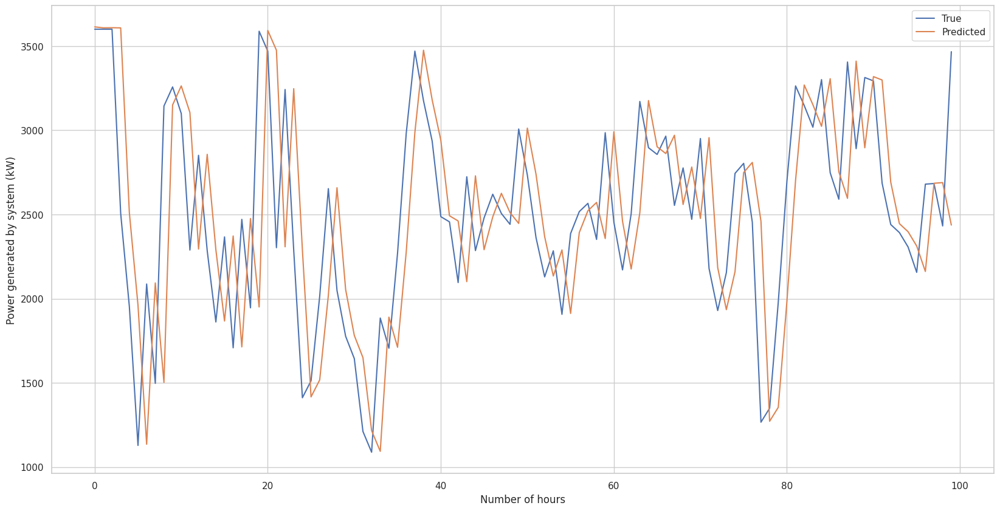

In [ ]:
# line plot of observed vs predicted
sns.set_style("whitegrid")
pyplot.figure(figsize=(20,10))
pyplot.plot(expectations_plot[0:100], label="True")
pyplot.plot(predictions_plot[0:100], label="Predicted")
pyplot.legend(loc='upper right')
pyplot.xlabel("Number of hours")
pyplot.ylabel("Power generated by system (kW)")
pyplot.show()

In [ ]:
from sklearn.metrics import r2_score
r_squared_value = r2_score(expectations_plot,predictions_plot)
print(r_squared_value)

0.9175808442633426


In [ ]:
scaler2, train_scaled2, test_scaled2 = scale(train, test)
gru_model=fit_gru(train_scaled2, batch_size_exp, 2, neurons_exp)
%tensorboard --logdir logs

[[[ 0.          0.          0.         ...  0.          0.
    0.        ]]

 [[ 0.02877461  0.          0.         ...  0.          0.
    0.        ]]

 [[-0.03583819  0.02877461  0.         ...  0.          0.
    0.        ]]

 ...

 [[ 0.          0.          0.         ...  0.          0.
    0.        ]]

 [[ 0.          0.          0.         ...  0.          0.
    0.        ]]

 [[ 0.          0.          0.         ...  0.          0.
    0.        ]]]
49519/49519 [==============================] - 196s 4ms/step - loss: 0.0057 - val_loss: 0.0057


<IPython.core.display.Javascript object>

In [ ]:
# walk-forward validation on the test data
predictions2 = list()
expectations2 = list()
predictions_plot2 = list()
expectations_plot2 = list()
test_pred2 = list()
for i in range(len(test_scaled)):
    # make one-step forecast
    X2, y2 = test_scaled2[i, 0:-1], test_scaled2[i, -1]
    yhat2 = forecast_lstm(gru_model, 1, X2)#batch_size_exp to 1
    '''# Start Debug prints
    print("X: %", X)
    print("yhat: %", yhat)
    # End Debug prints'''
    # Replacing value in test scaled with the predicted value.
    test_pred2 = [yhat2] + test_pred2
    if len(test_pred2) > lag_exp+1:
        test_pred2 = test_pred2[:-1]
    if i+1<len(test_scaled2):
        if i+1 > lag_exp+1:
            test_scaled2[i+1] = test_pred2
        else:
            test_scaled2[i+1] = np.concatenate((test_pred2, test_scaled2[i+1, i+1:]),axis=0)

    # invert scaling
    yhat2 = invert_scale(scaler2, X2, yhat2)
    # invert differencing
    yhat2 = inverse_difference(raw_values, yhat2, len(test_scaled2)+1-i)
    # store forecast
    expected2 = raw_values[len(train) + i + 1]
    predictions_plot2.append(yhat2)
    expectations_plot2.append(expected2)
    if expected2 != 0:
        predictions2.append(yhat)
        expectations2.append(expected)
    print('Hour=%d, Predicted=%f, Expected=%f' % (i+1, yhat2, expected2))

1/1 [==============================] - 0s 368ms/step
Hour=1, Predicted=3611.156595, Expected=3600.000000
1/1 [==============================] - 0s 20ms/step
Hour=2, Predicted=3611.626512, Expected=3600.000000
1/1 [==============================] - 0s 27ms/step
Hour=3, Predicted=3610.668061, Expected=3600.000000
1/1 [==============================] - 0s 22ms/step
Hour=4, Predicted=3609.664900, Expected=2506.112948
1/1 [==============================] - 0s 23ms/step
Hour=5, Predicted=2514.909103, Expected=1954.282949
1/1 [==============================] - 0s 21ms/step
Hour=6, Predicted=1962.346392, Expected=1128.684225
1/1 [==============================] - 0s 30ms/step
Hour=7, Predicted=1136.046989, Expected=2087.002742
1/1 [==============================] - 0s 23ms/step
Hour=8, Predicted=2093.837829, Expected=1497.144149
1/1 [==============================] - 0s 27ms/step
Hour=9, Predicted=1503.327770, Expected=3143.880909
1/1 [==============================] - 0s 21ms/step
Hour=10, Pr

In [ ]:
expectations2 = np.array(expectations2)
predictions2 = np.array(predictions2)
print("Mean Absolute Percent Error: ", (np.mean(np.abs((expectations2 - predictions2) / expectations2))))

Mean Absolute Percent Error:  0.04148238710026566


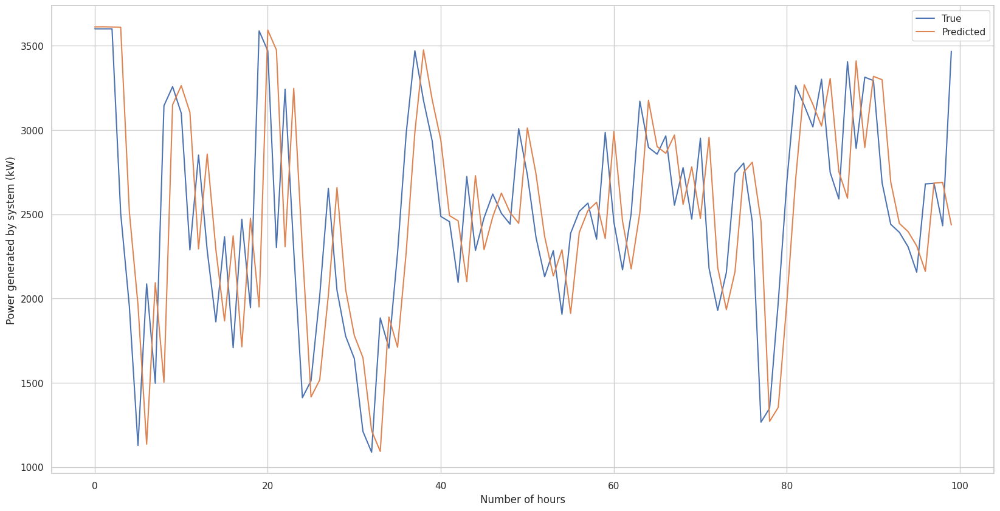

In [ ]:
# line plot of observed vs predicted
sns.set_style("whitegrid")
pyplot.figure(figsize=(20,10))
pyplot.plot(expectations_plot2[0:100], label="True")
pyplot.plot(predictions_plot2[0:100], label="Predicted")
pyplot.legend(loc='upper right')
pyplot.xlabel("Number of hours")
pyplot.ylabel("Power generated by system (kW)")
pyplot.show()

In [ ]:
from sklearn.metrics import r2_score
r_squared_value = r2_score(expectations_plot2,predictions_plot2)
print(r_squared_value)

0.9175763101963765


In [ ]:
# fit the model
scaler3, train_scaled3, test_scaled3 = scale(train, test)
lstm_model = fit_lstm(train_scaled3, batch_size_exp, 2, neurons_exp)
%tensorboard --logdir logs

[[[ 0.          0.          0.         ...  0.          0.
    0.        ]]

 [[ 0.02877461  0.          0.         ...  0.          0.
    0.        ]]

 [[-0.03583819  0.02877461  0.         ...  0.          0.
    0.        ]]

 ...

 [[ 0.          0.          0.         ...  0.          0.
    0.        ]]

 [[ 0.          0.          0.         ...  0.          0.
    0.        ]]

 [[ 0.          0.          0.         ...  0.          0.
    0.        ]]]
49519/49519 [==============================] - 193s 4ms/step - loss: 0.0056 - val_loss: 0.0056


<IPython.core.display.Javascript object>

In [ ]:
# walk-forward validation on the test data
predictions3 = list()
expectations3 = list()
predictions_plot3 = list()
expectations_plot3 = list()
test_pred3 = list()
for i in range(len(test_scaled3)):
    # make one-step forecast
    X3, y3 = test_scaled3[i, 0:-1], test_scaled3[i, -1]
    yhat3 = forecast_lstm(lstm_model, 1, X3)#batch_size_exp to 1
    '''# Start Debug prints
    print("X: %", X)
    print("yhat: %", yhat)
    # End Debug prints'''
    # Replacing value in test scaled with the predicted value.
    test_pred3 = [yhat3] + test_pred3
    if len(test_pred3) > lag_exp+1:
        test_pred3 = test_pred3[:-1]
    if i+1<len(test_scaled3):
        if i+1 > lag_exp+1:
            test_scaled3[i+1] = test_pred3
        else:
            test_scaled3[i+1] = np.concatenate((test_pred3, test_scaled3[i+1, i+1:]),axis=0)

    # invert scaling
    yhat3 = invert_scale(scaler3, X3, yhat3)
    # invert differencing
    yhat3 = inverse_difference(raw_values, yhat3, len(test_scaled3)+1-i)
    # store forecast
    expected3 = raw_values[len(train) + i + 1]
    predictions_plot3.append(yhat3)
    expectations_plot3.append(expected3)
    if expected3 != 0:
        predictions3.append(yhat3)
        expectations3.append(expected3)
    print('Hour=%d, Predicted=%f, Expected=%f' % (i+1, yhat3, expected3))

1/1 [==============================] - 1s 701ms/step
Hour=1, Predicted=3601.892266, Expected=3600.000000
1/1 [==============================] - 0s 22ms/step
Hour=2, Predicted=3603.910554, Expected=3600.000000
1/1 [==============================] - 0s 31ms/step
Hour=3, Predicted=3605.107839, Expected=3600.000000
1/1 [==============================] - 0s 22ms/step
Hour=4, Predicted=3605.792077, Expected=2506.112948
1/1 [==============================] - 0s 25ms/step
Hour=5, Predicted=2512.295706, Expected=1954.282949
1/1 [==============================] - 0s 27ms/step
Hour=6, Predicted=1960.673523, Expected=1128.684225
1/1 [==============================] - 0s 20ms/step
Hour=7, Predicted=1135.169543, Expected=2087.002742
1/1 [==============================] - 0s 19ms/step
Hour=8, Predicted=2093.540788, Expected=1497.144149
1/1 [==============================] - 0s 19ms/step
Hour=9, Predicted=1503.643325, Expected=3143.880909
1/1 [==============================] - 0s 20ms/step
Hour=10, Pr

In [ ]:
expectations3 = np.array(expectations3)
predictions3 = np.array(predictions3)
print("Mean Absolute Percent Error: ", (np.mean(np.abs((expectations3 - predictions3) / expectations3))))

Mean Absolute Percent Error:  0.4603054034715627


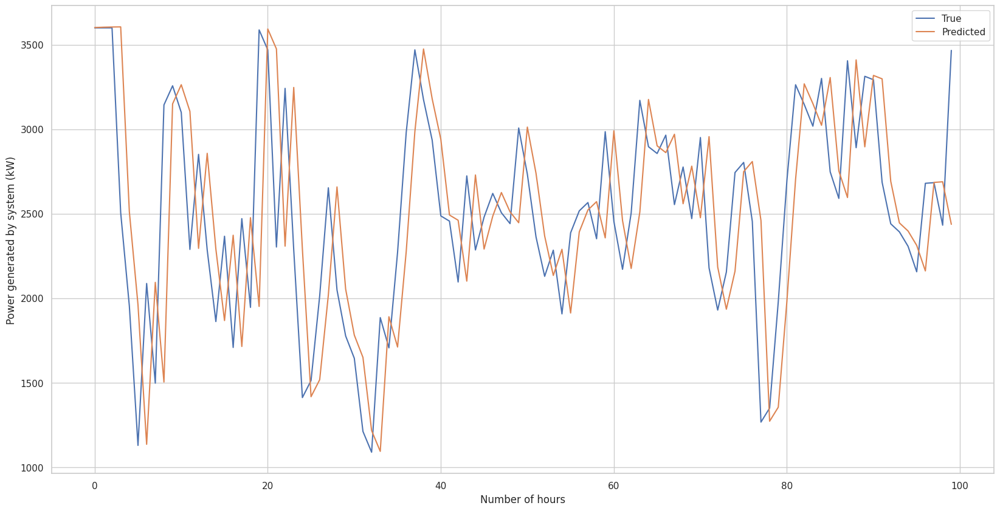

In [ ]:
# line plot of observed vs predicted
sns.set_style("whitegrid")
pyplot.figure(figsize=(20,10))
pyplot.plot(expectations_plot3[0:100], label="True")
pyplot.plot(predictions_plot3[0:100], label="Predicted")
pyplot.legend(loc='upper right')
pyplot.xlabel("Number of hours")
pyplot.ylabel("Power generated by system (kW)")
pyplot.show()

In [ ]:
from sklearn.metrics import r2_score
r_squared_value = r2_score(expectations_plot3,predictions_plot3)
print(r_squared_value)

0.9175877822484995
